In [5]:
import os
from PIL import Image, ImageOps
from tqdm import tqdm

from google.colab import drive

import random
import shutil

import json
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

Mount Google drive Storage

In [6]:
# @title
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


Define all initial important path

In [7]:
base_path = '/content/drive/MyDrive/proyek_cnn/'
image_dataset_path = base_path + '/dataset_padang_cuisine'
models_path = base_path + '/models'

Image Processing

Center Crop and Resize to 224x224

In [14]:
# @title

# Hardcoded, as a protection to prevent image regeneration
REGENERATE_RESIZED_IMAGE = False

if (REGENERATE_RESIZED_IMAGE):
  input_dir = os.path.join(image_dataset_path, 'original_size')
  output_dir = os.path.join(image_dataset_path, 'resized_224_224')
  target_size = (224, 224)

  # ENSURE OUTPUT STRUCTURE
  os.makedirs(output_dir, exist_ok=True)
  for class_name in os.listdir(input_dir):
      class_path = os.path.join(input_dir, class_name)
      if os.path.isdir(class_path):
          os.makedirs(os.path.join(output_dir, class_name), exist_ok=True)

  # PROCESS EACH CLASS
  for class_name in os.listdir(input_dir):
      input_class_path = os.path.join(input_dir, class_name)
      output_class_path = os.path.join(output_dir, class_name)

      if not os.path.isdir(input_class_path):
          continue

      print(f'Processing class: {class_name}')

      for img_name in tqdm(os.listdir(input_class_path)):
          input_img_path = os.path.join(input_class_path, img_name)
          output_img_name = os.path.splitext(img_name)[0] + '.jpg'
          output_img_path = os.path.join(output_class_path, output_img_name)

          if os.path.exists(output_img_path):
            continue

          try:
              # Open and convert to RGB
              with Image.open(input_img_path) as img:
                  img = img.convert('RGB')

                  # CENTER CROP + RESIZE
                  img = ImageOps.fit(img, target_size, Image.Resampling.LANCZOS, centering=(0.5, 0.5))

                  # Save as JPEG (quality 90)
                  img.save(output_img_path, 'JPEG', quality=90)

          except Exception as e:
              print(f"Error processing {img_name}: {e}")
else:
  print("Resize Image Process skipped")

Processing class: dendeng_batokok


100%|██████████| 109/109 [00:03<00:00, 33.66it/s]


Processing class: gulai_ikan


100%|██████████| 111/111 [00:03<00:00, 31.35it/s]


Processing class: daging_rendang


100%|██████████| 104/104 [00:04<00:00, 23.24it/s]


Processing class: ayam_pop


100%|██████████| 113/113 [00:03<00:00, 32.72it/s]


Processing class: telur_dadar


100%|██████████| 116/116 [00:03<00:00, 30.01it/s]


Processing class: gulai_tunjang


100%|██████████| 119/119 [00:03<00:00, 35.15it/s]


Processing class: ayam_goreng


100%|██████████| 107/107 [00:04<00:00, 24.35it/s]


Processing class: gulai_tambusu


100%|██████████| 103/103 [00:02<00:00, 35.29it/s]


Processing class: telur_balado


100%|██████████| 111/111 [00:03<00:00, 34.94it/s]


In [22]:
# @title
# Hardcoded, as a protection to prevent dataset split
SPLIT_DATASET = False

if (SPLIT_DATASET):
  # Config
  resized_dir = os.path.join(image_dataset_path, 'resized_224_224')   # sumber
  out_base = os.path.join(image_dataset_path, 'dataset_split')       # target root
  splits = {'train': 0.7, 'val': 0.2, 'test': 0.1}          # rasio, total must be = 1.0
  random_seed = 12345
  copy_not_move = True   # True => copy files; False => move files

  # Sanity Check
  assert abs(sum(splits.values()) - 1.0) < 1e-6, "Split ratios must sum to 1.0"
  os.makedirs(out_base, exist_ok=True)

  # Prepare output subfolders per class
  class_names = [d for d in os.listdir(resized_dir) if os.path.isdir(os.path.join(resized_dir, d))]
  class_names.sort()

  for split in splits.keys():
      for cls in class_names:
          dest = os.path.join(out_base, split, cls)
          os.makedirs(dest, exist_ok=True)

  # Function to safe copy/move without overwrite
  def safe_copy_or_move(src_path, dst_path, move=False):
      # If destination file exists, skip
      if os.path.exists(dst_path):
          return False
      if move:
          shutil.move(src_path, dst_path)
      else:
          shutil.copy2(src_path, dst_path)
      return True

  # Split per class
  random.seed(random_seed)

  summary = {split: {cls: 0 for cls in class_names} for split in splits.keys()}

  for cls in class_names:
      src_folder = os.path.join(resized_dir, cls)
      all_files = [f for f in os.listdir(src_folder)
                  if os.path.isfile(os.path.join(src_folder, f)) and f.lower().endswith(('.jpg', '.jpeg', '.png'))]
      all_files.sort()
      random.shuffle(all_files)

      n_total = len(all_files)
      n_train = int(round(splits['train'] * n_total))
      n_val = int(round(splits['val'] * n_total))
      # ensure sum to n_total by assigning rest to test
      n_test = n_total - n_train - n_val

      # index slicing
      idx = 0
      # train
      for f in all_files[idx: idx + n_train]:
          src = os.path.join(src_folder, f)
          dst = os.path.join(out_base, 'train', cls, os.path.splitext(f)[0] + '.jpg')
          try:
              safe_copy_or_move(src, dst, move=not copy_not_move)
              summary['train'][cls] += 1
          except Exception as e:
              print(f"Error copying {src} -> {dst}: {e}")
      idx += n_train

      # val
      for f in all_files[idx: idx + n_val]:
          src = os.path.join(src_folder, f)
          dst = os.path.join(out_base, 'val', cls, os.path.splitext(f)[0] + '.jpg')
          try:
              safe_copy_or_move(src, dst, move=not copy_not_move)
              summary['val'][cls] += 1
          except Exception as e:
              print(f"Error copying {src} -> {dst}: {e}")
      idx += n_val

      # test
      for f in all_files[idx: idx + n_test]:
          src = os.path.join(src_folder, f)
          dst = os.path.join(out_base, 'test', cls, os.path.splitext(f)[0] + '.jpg')
          try:
              safe_copy_or_move(src, dst, move=not copy_not_move)
              summary['test'][cls] += 1
          except Exception as e:
              print(f"Error copying {src} -> {dst}: {e}")

  # Print Summary
  print("\n=== Split Summary ===")
  for split in ['train', 'val', 'test']:
      total = sum(summary[split].values())
      print(f"{split.upper()}: {total} images")
      for cls in class_names:
          print(f"  {cls}: {summary[split][cls]}")
      print('-------------------')
else:
  print("Data Split Process skipped")


=== Split Summary ===
TRAIN: 695 images
  ayam_goreng: 75
  ayam_pop: 79
  daging_rendang: 73
  dendeng_batokok: 76
  gulai_ikan: 78
  gulai_tambusu: 72
  gulai_tunjang: 83
  telur_balado: 78
  telur_dadar: 81
-------------------
VAL: 199 images
  ayam_goreng: 21
  ayam_pop: 23
  daging_rendang: 21
  dendeng_batokok: 22
  gulai_ikan: 22
  gulai_tambusu: 21
  gulai_tunjang: 24
  telur_balado: 22
  telur_dadar: 23
-------------------
TEST: 99 images
  ayam_goreng: 11
  ayam_pop: 11
  daging_rendang: 10
  dendeng_batokok: 11
  gulai_ikan: 11
  gulai_tambusu: 10
  gulai_tunjang: 12
  telur_balado: 11
  telur_dadar: 12
-------------------


Pre Processing Pipeline for Padang cuisine dataset (train/val/test folder structure)

In [8]:
# @title
# - Expects directory structure:
#   dataset_split/
#     ├─ train/
#     │   ├─ ayam_goreng/
#     │   ├─ ayam_pop/
#     │   ...
#     ├─ val/
#     └─ test/
#
# - Uses MobileNetV2 preprocess_input to scale pixels to [-1, 1]
# - Applies augmentation only to training dataset (RandomFlip, RandomRotation, RandomZoom, translation)
# - Uses tf.data optimizations (cache, prefetch)

# Config
PREPROCESSING_BASE_PATH = image_dataset_path + '/dataset_split'
TRAIN_DIR = os.path.join(PREPROCESSING_BASE_PATH, 'train')
VAL_DIR   = os.path.join(PREPROCESSING_BASE_PATH, 'val')
TEST_DIR  = os.path.join(PREPROCESSING_BASE_PATH, 'test')

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 12345
AUTOTUNE = tf.data.AUTOTUNE

# ====== 1) Create base tf.data datasets from directory ======
# Note: image_dataset_from_directory returns images scaled 0-255 as float32 by default
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAIN_DIR,
    labels='inferred',
    label_mode='categorical',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=SEED
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    VAL_DIR,
    labels='inferred',
    label_mode='categorical',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=False
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=False
)

# Save class names mapping for future reference (e.g., inference)
class_names = train_ds.class_names
print("Classes:", class_names)
with open('/content/class_names.json', 'w') as f:
    json.dump(class_names, f, indent=2)

# ====== 2) Define augmentation pipeline (only applied to training) ======
# You can tweak the augmentation strengths below
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),                        # horizontal flips
    layers.RandomRotation(0.06),                            # ~ +/- 20 degrees -> 0.06 * 2pi ~ small; keep small
    layers.RandomZoom(height_factor=(-0.08, 0.08), width_factor=(-0.08, 0.08)),  # +/- 8% zoom
    layers.RandomTranslation(0.06, 0.06)                    # translate up to ~6% in each axis
], name="data_augmentation")

# ====== 3) Preprocessing function to apply augmentation (train) and normalization (all) ======
# Sequence: augmentation (float32 in 0..255) -> preprocess_input -> result in [-1, 1]
def prepare_train_batch(images, labels):
    # images: uint8/float32 in [0,255]
    images = tf.cast(images, tf.float32)
    images = data_augmentation(images, training=True)   # augmentation only for training
    images = preprocess_input(images)                   # scales to [-1, 1]
    return images, labels

def prepare_eval_batch(images, labels):
    images = tf.cast(images, tf.float32)
    images = preprocess_input(images)                   # scales to [-1, 1]
    return images, labels

# ====== 4) Apply the mapping and performance optimizations ======
train_ds = train_ds.map(prepare_train_batch, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.cache()           # cache in memory (if fits) or to disk if you prefer
train_ds = train_ds.shuffle(1024, seed=SEED)  # extra shuffle buffer
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)

val_ds = val_ds.map(prepare_eval_batch, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.cache()
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

test_ds = test_ds.map(prepare_eval_batch, num_parallel_calls=AUTOTUNE)
test_ds = test_ds.cache()
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

# ====== 5) Optional: compute class weights (helpful if slight imbalance) ======
# This computes weights inversely proportional to class frequencies in TRAIN set
import numpy as np
from collections import Counter

def compute_class_weights_from_dir(train_dir, class_names):
    counts = []
    for cls in class_names:
        cls_dir = os.path.join(train_dir, cls)
        n = len([f for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        counts.append(n)
    counts = np.array(counts)
    total = counts.sum()
    # weight = total / (num_classes * count)
    num_classes = len(class_names)
    weights = {i: float(total / (num_classes * counts[i])) for i in range(num_classes)}
    return weights, dict(zip(class_names, counts.tolist()))

class_weights, per_class_counts = compute_class_weights_from_dir(TRAIN_DIR, class_names)
print("Per-class counts (train):", per_class_counts)
print("Class weights (for training):", class_weights)

# ====== 6) Quick sanity checks & info ======
# number of steps per epoch
train_samples = sum(per_class_counts.values())
val_samples = sum([len(os.listdir(os.path.join(VAL_DIR, c))) for c in class_names])
test_samples = sum([len(os.listdir(os.path.join(TEST_DIR, c))) for c in class_names])

steps_per_epoch = int(np.ceil(train_samples / BATCH_SIZE))
validation_steps = int(np.ceil(val_samples / BATCH_SIZE))
test_steps = int(np.ceil(test_samples / BATCH_SIZE))

print(f"Train samples: {train_samples}, Steps/epoch: {steps_per_epoch}")
print(f"Val samples: {val_samples}, Validation steps: {validation_steps}")
print(f"Test samples: {test_samples}, Test steps: {test_steps}")

# ====== 7) Return/Expose datasets for model training ======
# The variables train_ds, val_ds, test_ds are ready to be used with model.fit(...)
# Example usage (not executed here): model.fit(train_ds, validation_data=val_ds, epochs=..., class_weight=class_weights)


Found 695 files belonging to 9 classes.
Found 199 files belonging to 9 classes.
Found 99 files belonging to 9 classes.
Classes: ['ayam_goreng', 'ayam_pop', 'daging_rendang', 'dendeng_batokok', 'gulai_ikan', 'gulai_tambusu', 'gulai_tunjang', 'telur_balado', 'telur_dadar']
Per-class counts (train): {'ayam_goreng': 75, 'ayam_pop': 79, 'daging_rendang': 73, 'dendeng_batokok': 76, 'gulai_ikan': 78, 'gulai_tambusu': 72, 'gulai_tunjang': 83, 'telur_balado': 78, 'telur_dadar': 81}
Class weights (for training): {0: 1.0296296296296297, 1: 0.9774964838255977, 2: 1.0578386605783867, 3: 1.0160818713450293, 4: 0.99002849002849, 5: 1.0725308641975309, 6: 0.9303882195448461, 7: 0.99002849002849, 8: 0.953360768175583}
Train samples: 695, Steps/epoch: 22
Val samples: 199, Validation steps: 7
Test samples: 99, Test steps: 4


Load MobileNet V2 with pre-trained weights

In [9]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224,224,3))
# base_model.summary()

Our private classifier, 9 food classes

To be combined with pretrained neuron



In [10]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(9, activation='softmax')(x)  # for 9 food classes
padang_cuisine_model = Model(inputs=base_model.input, outputs=predictions)

In [11]:
# Freeze pretrained layers
for layer in base_model.layers:
    layer.trainable = False

# Used for fine-tuning
# for layer in base_model.layers[-20:]:  # last 20 layers
#     layer.trainable = True

padang_cuisine_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

Training Pipeline

In [12]:
# ===== assume train_ds, val_ds, test_ds, class_names exist =====
try:
    _ = train_ds
    _ = val_ds
    _ = test_ds
    _ = class_names
    class_weights
except NameError:
    raise RuntimeError("train_ds / val_ds / test_ds / class_names / class_weight not found. Run the preprocessing cell first.")

EPOCHS = 30
MODEL_SAVE_PATH = models_path + '/padang_cuisine_model.h5'
os.makedirs(os.path.dirname(MODEL_SAVE_PATH), exist_ok=True)

history = padang_cuisine_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    class_weight=class_weights,
    verbose=2
)

# Save trained model
padang_cuisine_model.save(MODEL_SAVE_PATH)
print(f"Model saved as: {MODEL_SAVE_PATH}")

# Evaluate on test set
test_loss, test_acc = padang_cuisine_model.evaluate(test_ds, verbose=2)
print(f"Test Accuracy: {test_acc:.4f}")

Epoch 1/30
22/22 - 394s - 18s/step - accuracy: 0.3655 - loss: 1.8344 - val_accuracy: 0.6583 - val_loss: 1.1966
Epoch 2/30
22/22 - 1s - 37ms/step - accuracy: 0.7683 - loss: 0.8850 - val_accuracy: 0.7940 - val_loss: 0.7775
Epoch 3/30
22/22 - 1s - 34ms/step - accuracy: 0.8633 - loss: 0.5700 - val_accuracy: 0.8241 - val_loss: 0.6370
Epoch 4/30
22/22 - 1s - 34ms/step - accuracy: 0.9036 - loss: 0.4355 - val_accuracy: 0.8492 - val_loss: 0.5824
Epoch 5/30
22/22 - 1s - 33ms/step - accuracy: 0.9309 - loss: 0.3544 - val_accuracy: 0.8593 - val_loss: 0.5314
Epoch 6/30
22/22 - 1s - 33ms/step - accuracy: 0.9367 - loss: 0.3009 - val_accuracy: 0.8492 - val_loss: 0.4947
Epoch 7/30
22/22 - 1s - 33ms/step - accuracy: 0.9583 - loss: 0.2512 - val_accuracy: 0.8643 - val_loss: 0.4835
Epoch 8/30
22/22 - 1s - 33ms/step - accuracy: 0.9655 - loss: 0.2225 - val_accuracy: 0.8693 - val_loss: 0.4607
Epoch 9/30
22/22 - 1s - 33ms/step - accuracy: 0.9727 - loss: 0.1918 - val_accuracy: 0.8593 - val_loss: 0.4363
Epoch 10/

Model saved as: /content/drive/MyDrive/proyek_cnn//models/padang_cuisine_model.h5
4/4 - 51s - 13s/step - accuracy: 0.8788 - loss: 0.4013
Test Accuracy: 0.8788


Prediction

In [13]:
# @title
from tensorflow.keras.models import load_model

MODEL_PATH = '/content/drive/MyDrive/proyek_cnn/models/padang_cuisine_model.h5'

try:
    padang_cuisine_model
    print("Using existing model in memory: padang_cuisine_model")
except NameError:
    print("Model not found in memory. Loading from saved file...")
    if os.path.exists(MODEL_PATH):
        padang_cuisine_model = load_model(MODEL_PATH)
        print(f"Model loaded successfully from: {MODEL_PATH}")
    else:
        raise FileNotFoundError(f"Saved model not found at: {MODEL_PATH}")


CLASS_NAMES_PATH = '/content/class_names.json'
if os.path.exists(CLASS_NAMES_PATH):
    with open(CLASS_NAMES_PATH, 'r') as f:
        class_names = json.load(f)
else:
    # fallback if variable still in session
    try:
        class_names = train_ds.class_names
    except NameError:
        raise RuntimeError("class_names not found. Provide path or recreate train_ds.")
print("Classes:", class_names)


Using existing model in memory: padang_cuisine_model
Classes: ['ayam_goreng', 'ayam_pop', 'daging_rendang', 'dendeng_batokok', 'gulai_ikan', 'gulai_tambusu', 'gulai_tunjang', 'telur_balado', 'telur_dadar']


In [15]:
# @title
import numpy as np
y_true = []
y_pred = []
y_prob = []

# iterate through test_ds batches
for images, labels in test_ds:          # test_ds yields (batch_images, batch_labels)
    probs = padang_cuisine_model.predict(images, verbose=0)   # shape: (batch_size, num_classes)
    preds = np.argmax(probs, axis=1)
    y_pred.extend(preds.tolist())
    y_prob.extend(probs.tolist())
    y_true.extend(np.argmax(labels.numpy(), axis=1).tolist())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_prob = np.array(y_prob)
print("Predictions done. samples:", len(y_true))

Predictions done. samples: 99


In [16]:
# @title
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

acc = accuracy_score(y_true, y_pred)
print(f"Overall test accuracy: {acc:.4f}")

cm = confusion_matrix(y_true, y_pred)
print("Confusion matrix:\n", cm)

print("Classification report:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

Overall test accuracy: 0.8788
Confusion matrix:
 [[10  0  1  0  0  0  0  0  0]
 [ 0 10  0  0  0  0  1  0  0]
 [ 0  0  9  0  0  0  1  0  0]
 [ 0  0  0 10  0  0  0  1  0]
 [ 0  0  0  0 10  0  1  0  0]
 [ 0  0  0  0  0  6  3  0  1]
 [ 0  0  0  0  1  0 11  0  0]
 [ 0  0  0  0  0  0  0 10  1]
 [ 0  0  0  0  1  0  0  0 11]]
Classification report:
                 precision    recall  f1-score   support

    ayam_goreng     1.0000    0.9091    0.9524        11
       ayam_pop     1.0000    0.9091    0.9524        11
 daging_rendang     0.9000    0.9000    0.9000        10
dendeng_batokok     1.0000    0.9091    0.9524        11
     gulai_ikan     0.8333    0.9091    0.8696        11
  gulai_tambusu     1.0000    0.6000    0.7500        10
  gulai_tunjang     0.6471    0.9167    0.7586        12
   telur_balado     0.9091    0.9091    0.9091        11
    telur_dadar     0.8462    0.9167    0.8800        12

       accuracy                         0.8788        99
      macro avg     0.9040  

🔹 Showing images 1–25 of 99


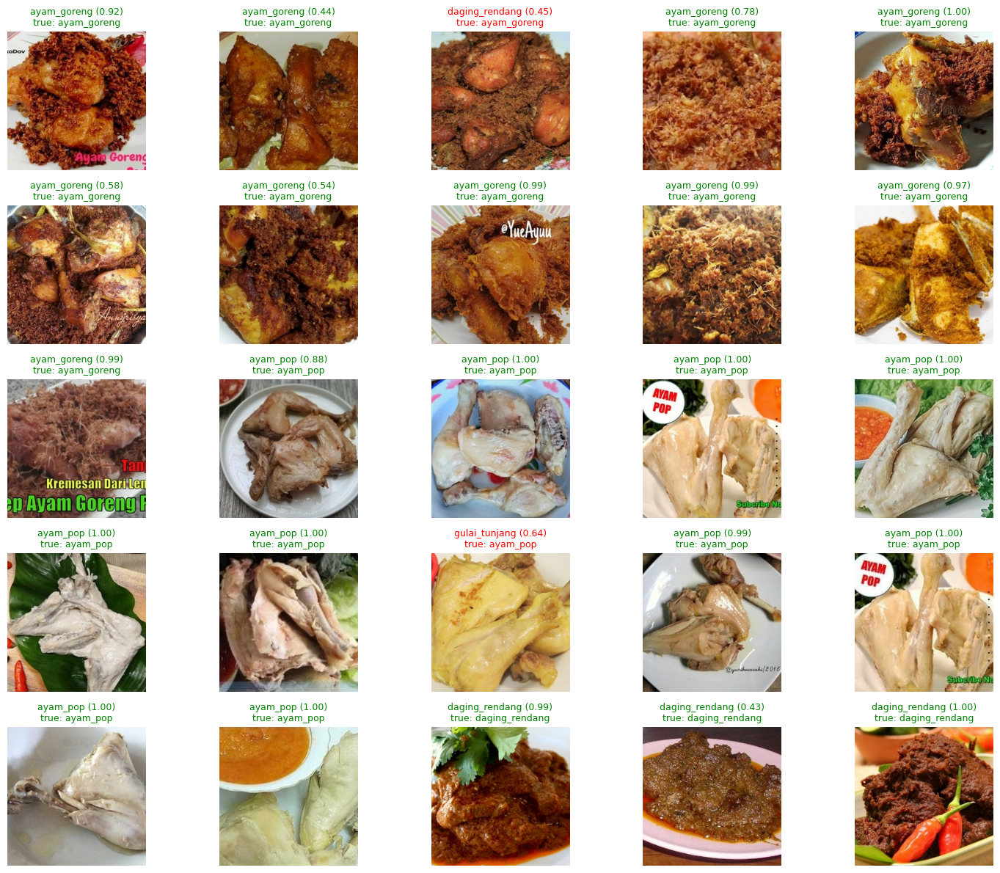

🔹 Showing images 26–50 of 99


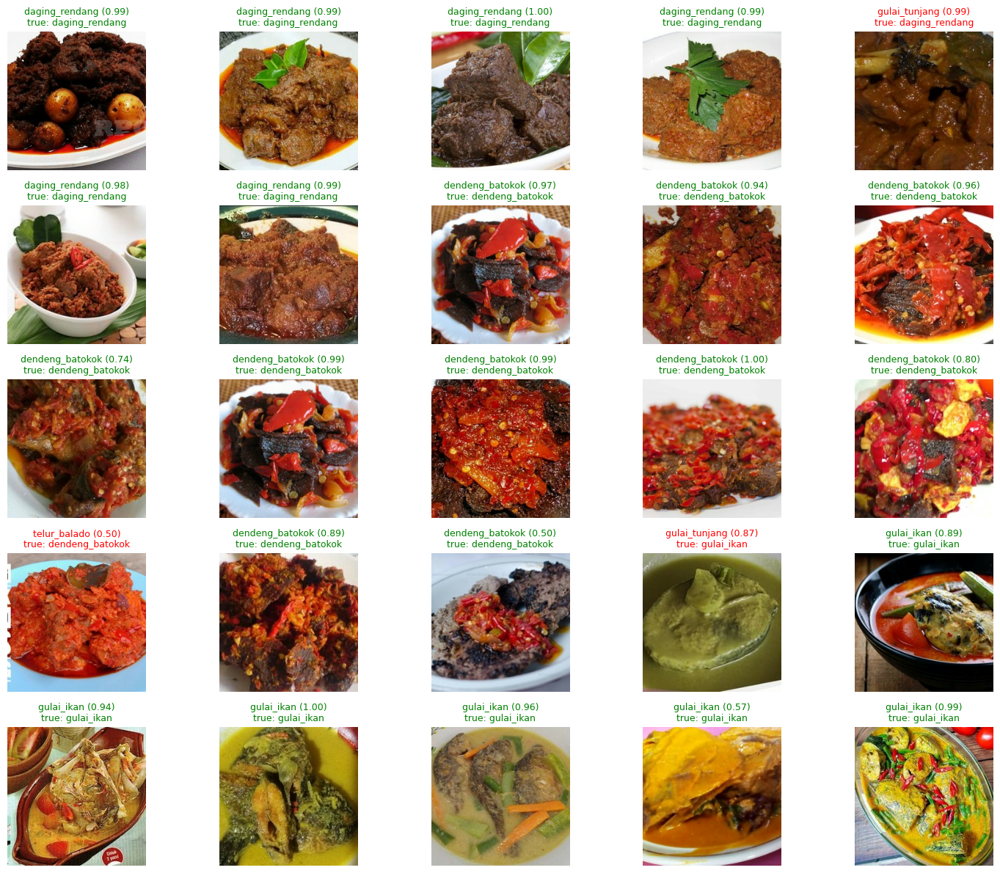

🔹 Showing images 51–75 of 99


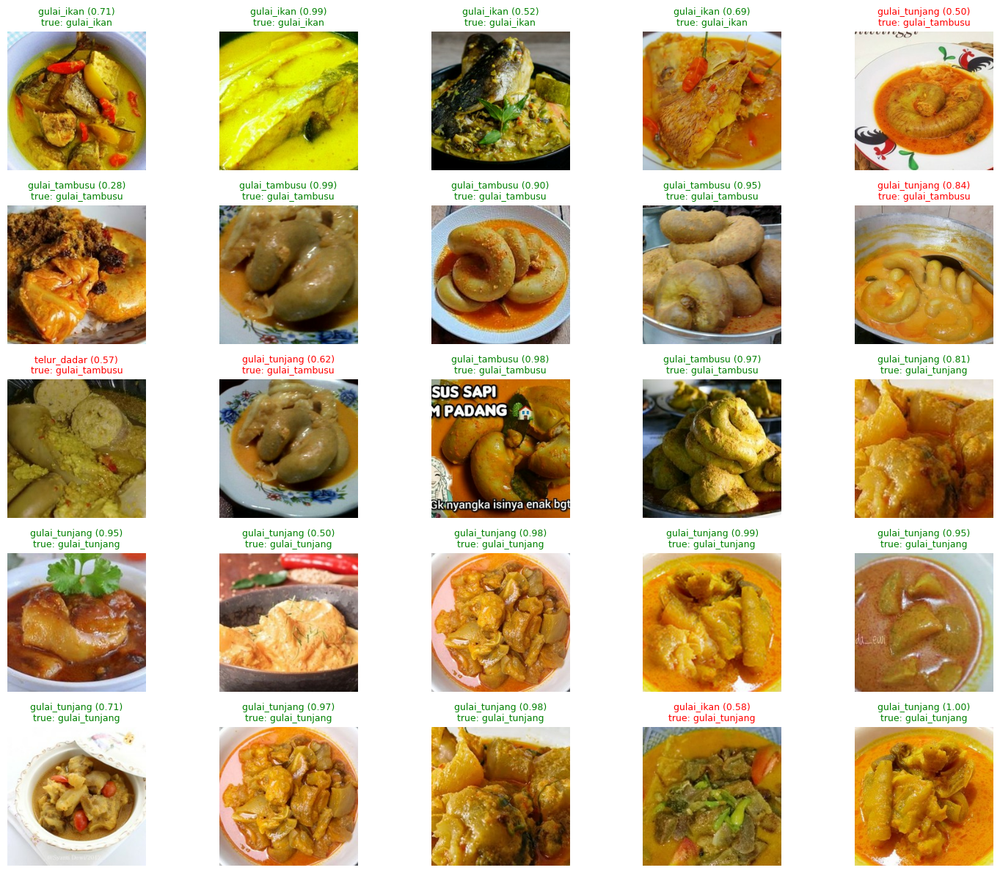

🔹 Showing images 76–99 of 99


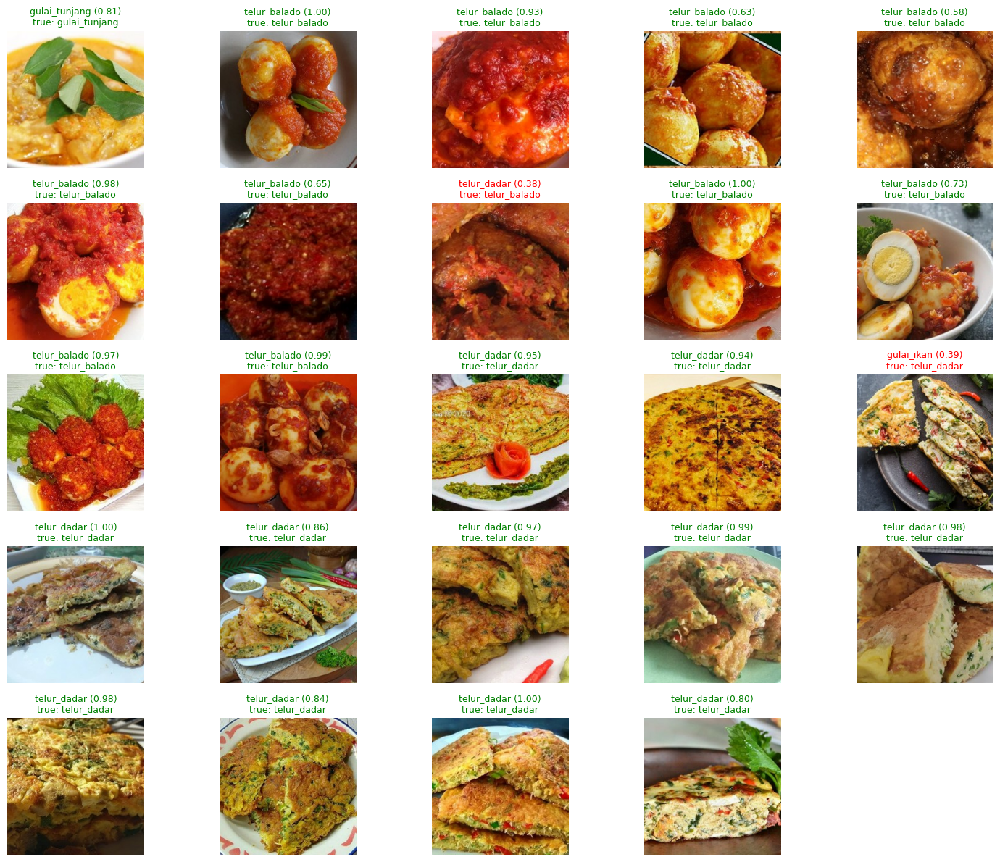

In [20]:
# @title
import matplotlib.pyplot as plt
import tensorflow as tf

# build an array of all test image filepaths, to show image file.
# Iterate over test_ds to collect raw images (as uint8) for display.
imgs = []
labels_idx = []
preds_idx = []
probs_all = []
for images, labels in test_ds:
    imgs.extend(images.numpy())         # images are normalized to [-1,1]; convert for display later
    labels_idx.extend(np.argmax(labels.numpy(), axis=1).tolist())
    probs = padang_cuisine_model.predict(images, verbose=0)
    preds_idx.extend(np.argmax(probs, axis=1).tolist())
    probs_all.extend(np.max(probs, axis=1).tolist())

# Denormalize for plotting
# (preprocess_input used earlier -> images in [-1,1])
def denormalize(img):
    # img in [-1,1] -> convert to [0,1] then [0,255]
    img = (img + 1.0) / 2.0
    img = np.clip(img, 0, 1)
    return (img * 255).astype('uint8')

import math
N_total = len(imgs)
cols = 5
rows = 5
per_page = cols * rows
pages = math.ceil(N_total / per_page)

for page in range(pages):
    start = page * per_page
    end = min(start + per_page, N_total)
    print(f"Showing images {start+1}–{end} of {N_total}")
    plt.figure(figsize=(15, 12))
    for i, idx in enumerate(range(start, end)):
        ax = plt.subplot(rows, cols, i + 1)
        im = denormalize(imgs[idx])
        plt.imshow(im)
        true_label = class_names[labels_idx[idx]]
        pred_label = class_names[preds_idx[idx]]
        conf = probs_all[idx]
        color = "green" if true_label == pred_label else "red"
        ax.set_title(f"{pred_label} ({conf:.2f})\ntrue: {true_label}",
                     fontsize=9, color=color)
        ax.axis('off')
    plt.tight_layout()
    plt.show()